In [101]:
import numpy as np
import nilearn
import nibabel as nib
from nilearn import datasets, plotting, regions
import matplotlib.pyplot as plt
import matplotlib as mpl
from brainspace.utils.parcellation import map_to_labels, reduce_by_labels
import brainspace
import seaborn as sns
import hcp_utils as hcp
import pandas as pd
from brainspace.datasets import load_conte69, load_parcellation
from brainspace.plotting import plot_hemispheres
from modeling_utils import *
import os
surf_lh, surf_rh = load_conte69()
from nilearn.connectome import sym_matrix_to_vec
import pickle
import json
import seaborn as sns


In [25]:
from neuromaps.datasets import fetch_fslr
from surfplot import Plot
from brainspace.datasets import load_parcellation

surfaces = fetch_fslr()
lh, rh = surfaces['inflated']
lh_parc, rh_parc = load_parcellation('schaefer', 1000)
schaefer_labels_1000 = load_parcellation('schaefer', scale=1000, join=True)

schaefer_region_names = nilearn.datasets.fetch_atlas_schaefer_2018(1000, yeo_networks = 7)
#schaefer_coords = plotting.find_parcellation_cut_coords(schaefer_region_names["maps"])

In [3]:
mpl.rcParams['svg.fonttype'] = 'none'

## Descriptive Stats

In [3]:
#data_paths = json.load(open('data_paths.json', 'r'))

data_paths = {
"COBRE-SCZ": "/Users/VictoriaShevchenko/Documents/PhD/SCZ/COBRE/clean_data/SCZ",
"COBRE-controls": "/Users/VictoriaShevchenko/Documents/PhD/SCZ/COBRE/clean_data/controls",
"LA5c": "/Users/VictoriaShevchenko/Documents/PhD/SCZ/LA5c/clean_data",
"SRPBS-1600-KTT": "/Users/VictoriaShevchenko/Documents/PhD/SCZ/SRPBS_1600/KTT/clean_data",
}

In [3]:
diagnosis_mapping = {
    'CONTROL': 0,
    'SCHZ': 1,
    'Schizophrenia_Strict': 1,
    'No_Known_Disorder': 0,
    4: 1,
    0: 0
}

In [131]:
participants = pd.read_csv('participants.csv')

In [193]:
schizophrenia_count = participants[participants['diagnosis'] == 1]['diagnosis'].count()
neurotypical_count = participants[participants['diagnosis'] == 0]['diagnosis'].count()
male_count = participants[participants['sex'] == 0]['sex'].count()
female_count = participants[participants['sex'] == 1]['sex'].count()

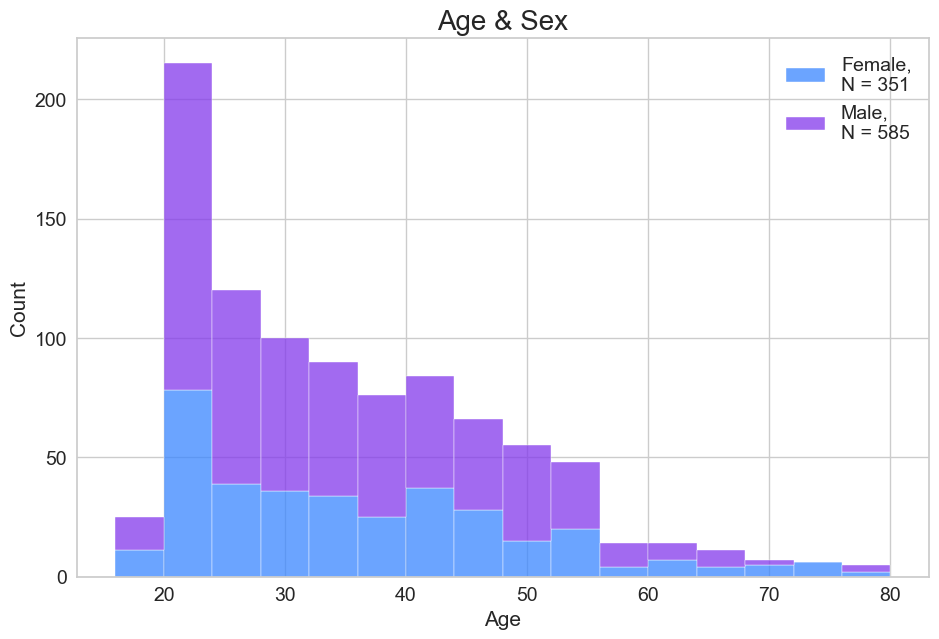

In [194]:

sns.set_style("whitegrid")
fig_dims = (11, 7)
fig, ax = plt.subplots(figsize=fig_dims)
bins = range(20)
sns.histplot(data = participants,
             x = 'age', ax=ax, hue= 'sex', palette=["#8338ec", '#3a86ff'],multiple='stack',legend=False)
new_labels = [f'Female,\nN = {female_count}' , f'Male,\nN = {male_count}']
plt.legend(new_labels, fontsize = 14)

ax.tick_params(axis='x', labelsize= 14) 
ax.tick_params(axis='y', labelsize= 14) 
plt.title('Age & Sex', fontsize= 20)
plt.xlabel('Age', fontsize = 15)
plt.ylabel('Count', fontsize = 15)
plt.savefig("../../figures/age_sex.svg", format = "svg", dpi = 300, bbox_inches='tight')

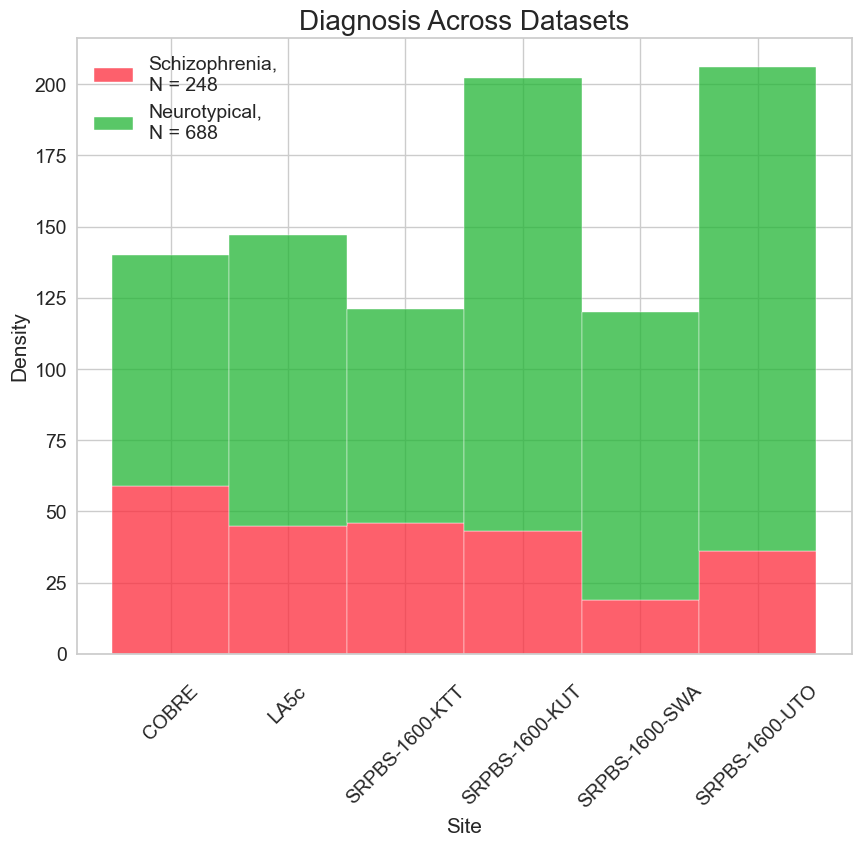

In [195]:
sns.set_style("whitegrid")
fig_dims = (10, 8)
fig, ax = plt.subplots(figsize=fig_dims)
bins = range(20)
sns.histplot(data = participants,
             x = 'dataset', ax=ax, hue = "diagnosis", palette=["#21b534", '#fd2b3b'], multiple="stack", legend = False)          
new_labels = [f'Schizophrenia,\nN = {schizophrenia_count}' , f'Neurotypical,\nN = {neurotypical_count}']
plt.legend(new_labels, fontsize = 14)

ax.tick_params(axis='x', labelsize= 14, rotation = 45)
ax.tick_params(axis='y', labelsize= 14) 
plt.xlabel('Site', fontsize = 15)
plt.ylabel('Density', fontsize = 15)
plt.title('Diagnosis Across Datasets', fontsize= 20)
ax.tick_params(axis='x', pad=20)
plt.savefig("../../figures/dataset_diag.svg", format = "svg", dpi = 300, bbox_inches='tight')

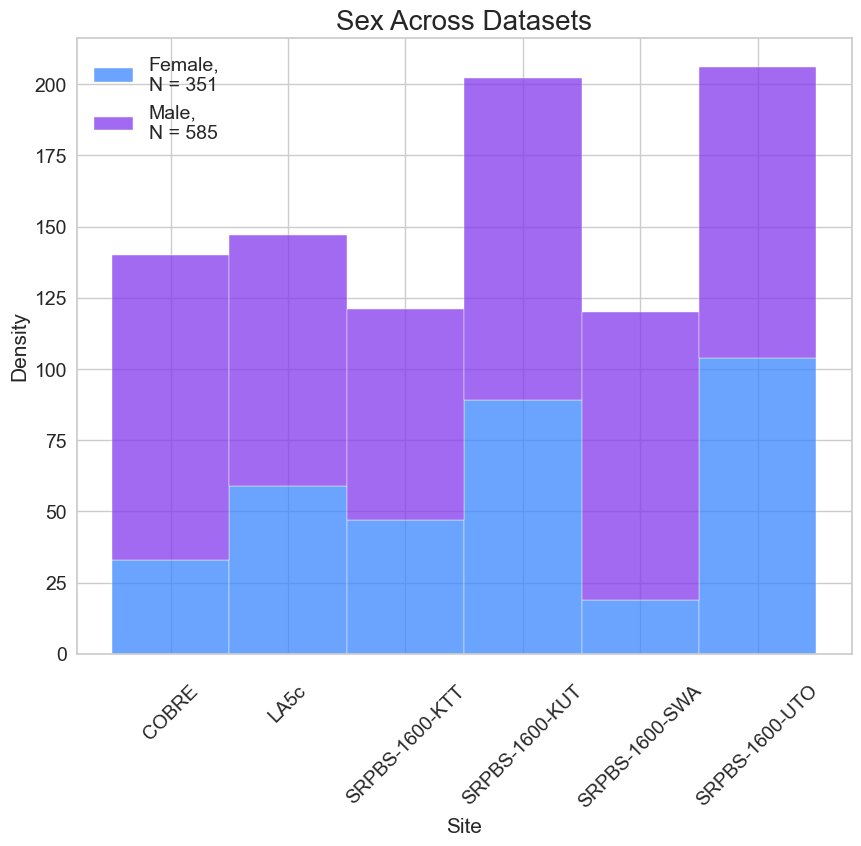

In [196]:
sns.set_style("whitegrid")
fig_dims = (10, 8)
fig, ax = plt.subplots(figsize=fig_dims)
bins = range(20)
sns.histplot(data = participants,
             x = 'dataset', ax=ax, hue = "sex", palette=["#8338ec", '#3a86ff'], multiple="stack", legend = False)    
new_labels = [f'Female,\nN = {female_count}' , f'Male,\nN = {male_count}']
plt.legend(new_labels, fontsize = 14)

ax.tick_params(axis='x', labelsize= 14, rotation = 45)
ax.tick_params(axis='y', labelsize= 14) 
plt.xlabel('Site', fontsize = 15)
plt.ylabel('Density', fontsize = 15)
plt.title('Sex Across Datasets', fontsize= 20)
ax.tick_params(axis='x', pad=20)
plt.savefig("../../figures/dataset_sex.svg", format = "svg", dpi = 300, bbox_inches='tight')

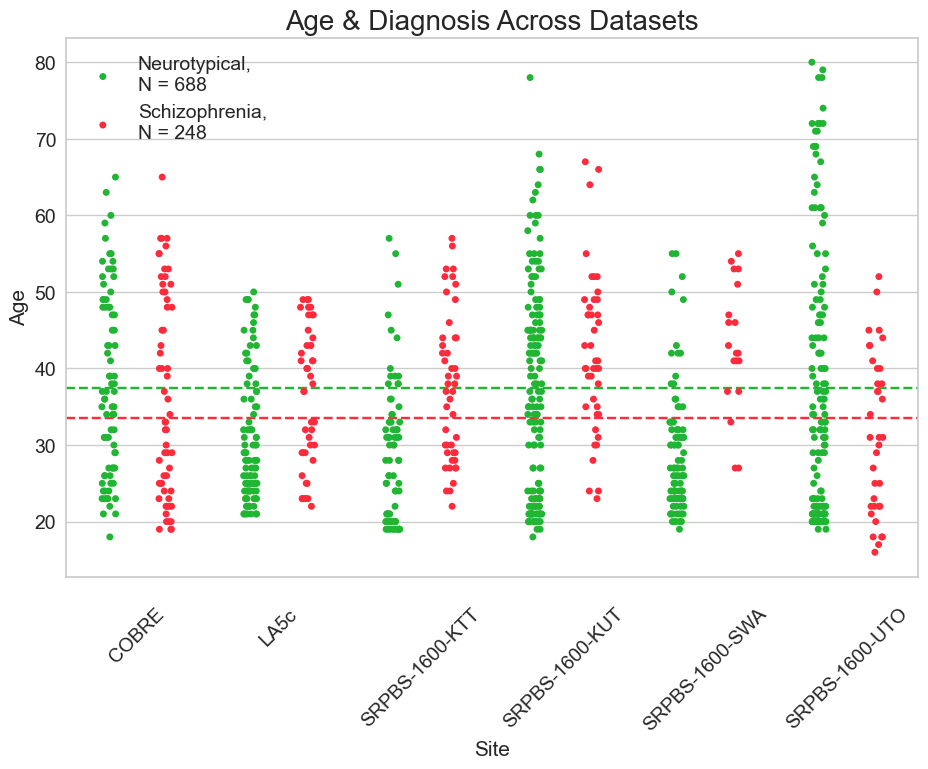

In [198]:
sns.set_style("whitegrid")
fig_dims = (11, 7)
fig, ax = plt.subplots(figsize=fig_dims)
bins = range(20)
sns.stripplot(data = participants, x = "dataset",
             y = 'age', ax=ax, hue= 'diagnosis', palette=["#21b534", '#fd2b3b'],legend=False, dodge = True)
new_labels = [f'Neurotypical,\nN = {neurotypical_count}', f'Schizophrenia,\nN = {schizophrenia_count}']
schizophrenia_mean_age = participants[participants['diagnosis'] == 1]['age'].mean()
neurotypical_mean_age = participants[participants['diagnosis'] == 0]['age'].mean()
ax.axhline(y=schizophrenia_mean_age, color='#21b534', linestyle='--')
ax.axhline(y=neurotypical_mean_age, color='#fd2b3b', linestyle='--')
plt.legend(new_labels, fontsize = 14)

ax.tick_params(axis='x', labelsize= 14, rotation = 45) 
ax.tick_params(axis='y', labelsize= 14) 
plt.title('Age & Diagnosis Across Datasets', fontsize= 20)
plt.xlabel('Site', fontsize = 15)
plt.ylabel('Age', fontsize = 15)
ax.tick_params(axis='x', pad=20)
plt.savefig("../../figures/age_diag_dataset.svg", format = "svg", dpi = 300, bbox_inches='tight')

In [184]:
participants[participants['diagnosis'] == 1]['age'].mean()
participants[participants['diagnosis'] == 0]['age'].mean()

33.55232558139535

## Gradient

### Atlas

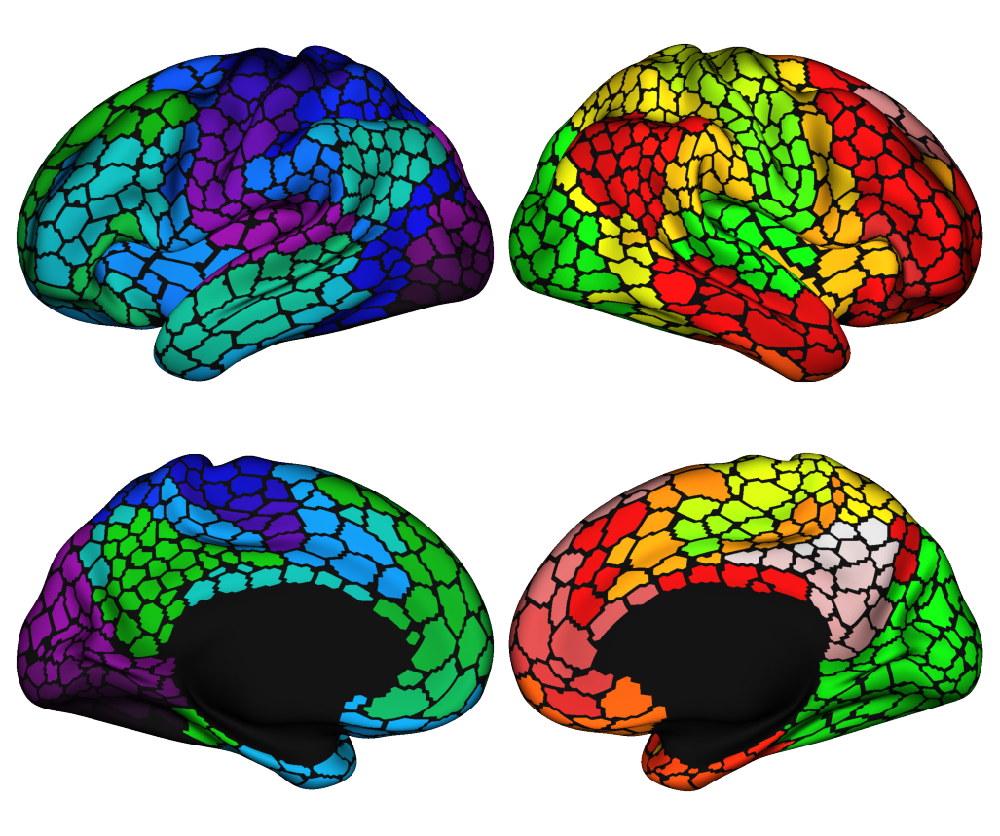

In [177]:

schaefer_plot = Plot(lh, rh, size=(1200, 1000))
schaefer_plot.add_layer({'left': lh_parc, 'right': rh_parc}, cbar=False, cmap="nipy_spectral")
schaefer_plot.add_layer({'left': lh_parc, 'right': rh_parc}, cmap='gray',
            as_outline=True, cbar=False)
fig = schaefer_plot.build()
fig.savefig(f"../../figures/cortex_regions/schaefer1000_atlas.svg", format = "svg", dpi = 300, bbox_inches='tight')

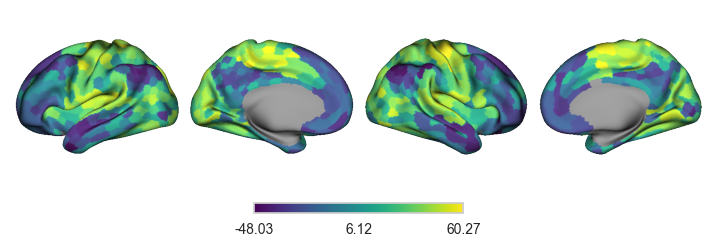

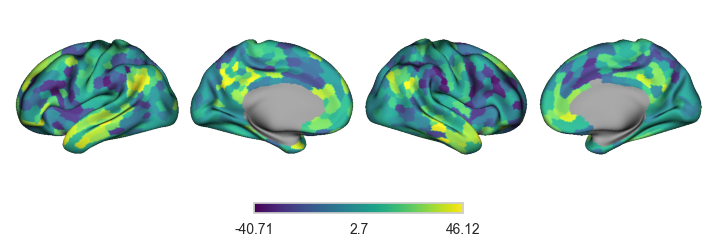

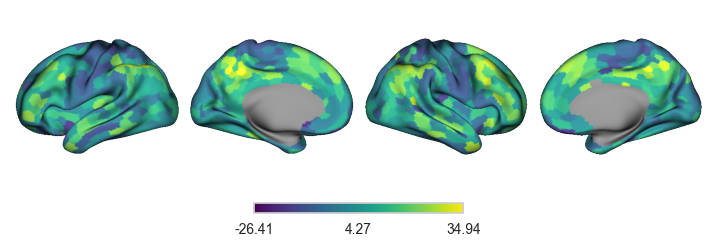

In [50]:
hcp_grad1_plot = Plot(lh, rh, size=(800, 200), zoom=1.2, layout='row')
hcp_grad1_plot.add_layer({'left': grad_mapped[0][:32492], 'right': grad_mapped[0][32492:]}, cmap = "viridis", zero_transparent=True)
fig = hcp_grad1_plot.build()

hcp_grad2_plot = Plot(lh, rh, size=(800, 200), zoom=1.2, layout='row')
hcp_grad2_plot.add_layer({'left': grad_mapped[1][:32492], 'right': grad_mapped[1][32492:]}, cmap = "viridis", zero_transparent=True)
fig = hcp_grad2_plot.build()

hcp_grad3_plot = Plot(lh, rh, size=(800, 200), zoom=1.2, layout='row')
hcp_grad3_plot.add_layer({'left': grad_mapped[2][:32492], 'right': grad_mapped[2][32492:]}, cmap = "viridis", zero_transparent=True)
fig = hcp_grad3_plot.build()


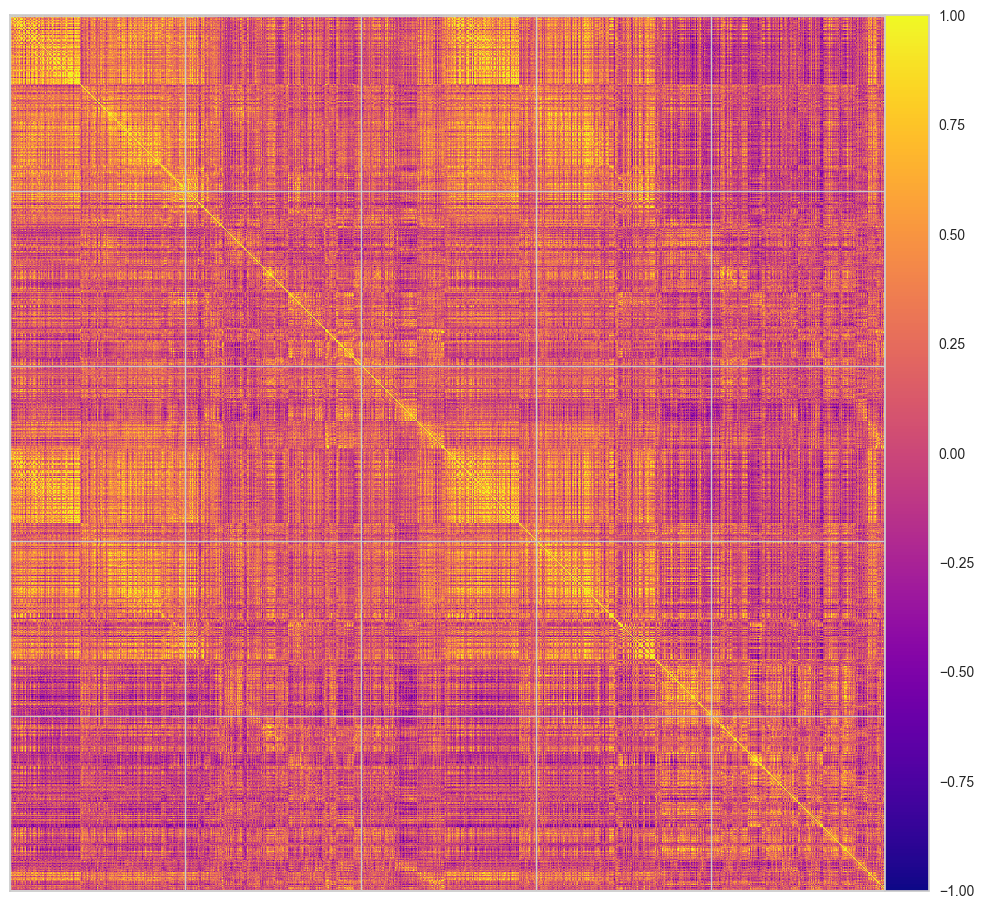

In [181]:
matrix = np.load("/Users/VictoriaShevchenko/Documents/PhD/SCZ/LA5c/clean_data/sub-10189/func/z-conn-matrix-sub-10189-rest-schaefer1000.npy")[0]
corr_plot = plotting.plot_matrix(matrix, figure=(10, 10), vmax=1, vmin=-1, cmap = 'plasma')


In [217]:
from brainspace.gradient.embedding import PCAMaps

pca = PCAMaps(n_components=200)
pca.fit(matrix)
grads_var_explained = pca.lambdas_ / pca.lambdas_.sum()
grads = np.arange(1, 201)
grads_var_explained = np.stack([grads_var_explained, grads])

In [218]:
grads_var_explained = pd.DataFrame(grads_var_explained.T, columns = ["Variance Explained", "Gradients"])

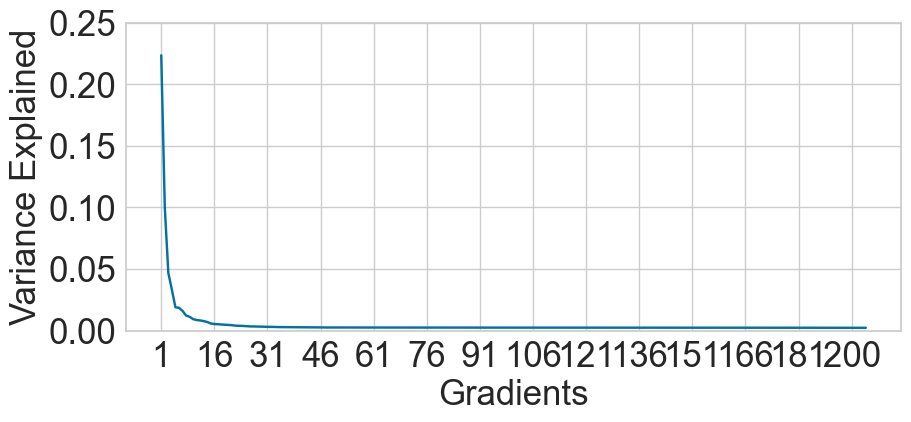

In [239]:
import matplotlib.pyplot as plt
import numpy as np

sns.set_style("whitegrid")
fig_dims = (10, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.lineplot(data=grads_var_explained, x="Gradients", y="Variance Explained")
ax.set_xticks(np.arange(1, 201, 15))
ax.set_xticklabels(np.append(np.arange(1, 201, 15)[:-1], 200))

ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=25)

ax.xaxis.label.set_size(25)
ax.yaxis.label.set_size(25)

# set the y-axis limits to start at 0 and end at the maximum value of "Variance Explained"
max_var_explained = grads_var_explained["Variance Explained"].max()
ax.set_ylim([-0.0001, 0.25])

plt.savefig("../../figures/grad_var_explained.svg", format = "svg", dpi = 300, bbox_inches='tight')

In [200]:
gradients = np.load("/Users/VictoriaShevchenko/Documents/PhD/SCZ/COBRE/clean_data/controls/sub-A00004087/func/aligned-10gradients-sub-A00004087-rest-schaefer1000.npy")[0]


In [201]:
gradients = gradients[:,:3]

In [202]:
grads3_df = pd.DataFrame(gradients, columns = ["Gradient 1", "Gradient 2", "Gradient 3"])

In [409]:
import plotly.express as px

fig1 = px.scatter(grads3_df, x="Gradient 2", y="Gradient 1",
              color_continuous_scale='Viridis', color='Gradient 1', opacity=1, template='plotly_white', width=600, height=600)
# Create a copy of the initial scatter plot and modify it to only show significant dots with a different color

fig1.update_traces(marker_size=5)

fig1.update_layout(scene=dict(
                    xaxis=dict(
                         backgroundcolor="white",
                         gridcolor="black",
                         showbackground=False,
                         zerolinecolor="white",
                         title="Gradient 2",
                         showticklabels=False,
                         titlefont=dict(size=50)),
                    yaxis=dict(
                        backgroundcolor="white",
                        gridcolor="black",
                        showbackground=False,
                        zerolinecolor="white",
                        title="Gradient 1",
                        showticklabels=False,
                        titlefont=dict(size=50))))
fig1.update_layout(coloraxis_showscale=False,font=dict(
        size=18))
fig1.write_image("../../figures/grad_embedding.svg")


In [44]:
grads = [None] * 3

for i, g in enumerate(gradients.T[:3]):
    grads[i] = map_to_labels(g, schaefer_labels_1000, mask=schaefer_labels_1000 != 0, fill=np.nan)

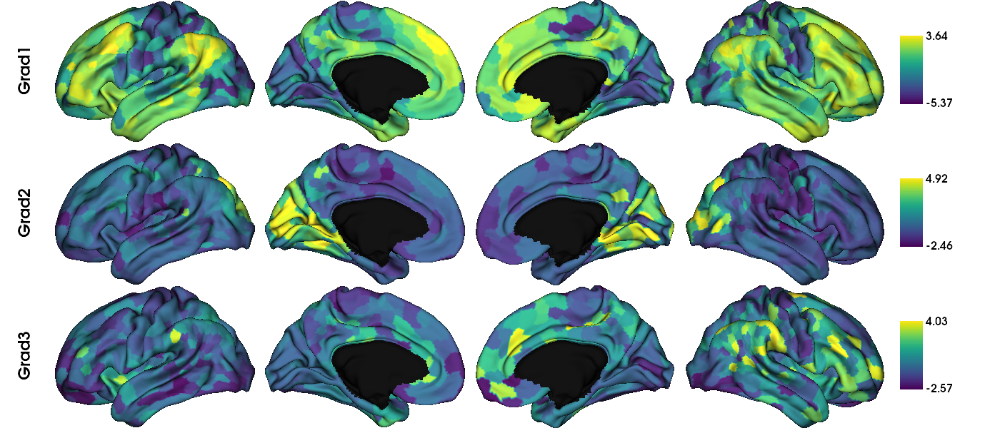

In [51]:
plot_hemispheres(surf_lh, surf_rh, array_name=grads, size=(1400, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.8, embed_nb = True)

In [56]:
dispersion = [np.load(f"/Users/VictoriaShevchenko/Documents/PhD/SCZ/LA5c/clean_data/sub-10189/func/{i}") for i in os.listdir("/Users/VictoriaShevchenko/Documents/PhD/SCZ/LA5c/clean_data/sub-10189/func/") if "disp" in i]

In [57]:
dispersion = np.array(dispersion)
dispersion.shape

(3, 1000)

In [58]:
disp = [None] * 3
for i, d in enumerate(dispersion):
    disp[i] = map_to_labels(d, schaefer_labels_1000, mask=schaefer_labels_1000 != 0, fill=np.nan)

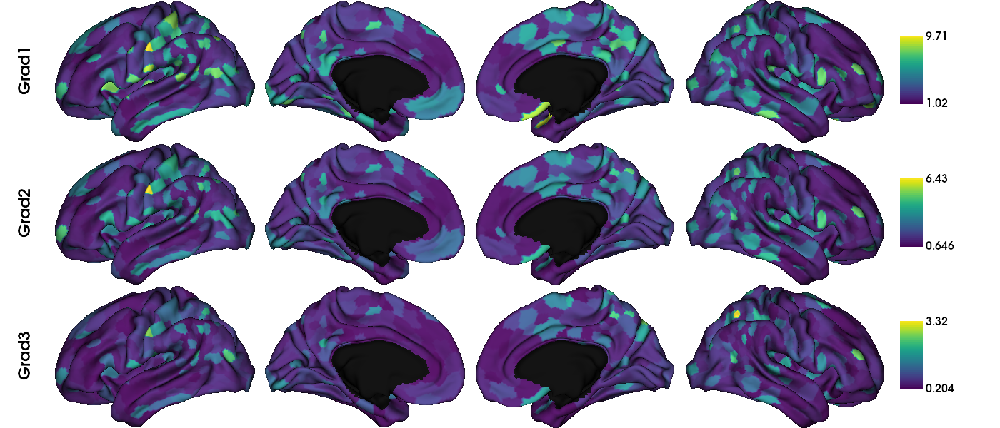

In [59]:
plot_hemispheres(surf_lh, surf_rh, array_name=disp, size=(1400, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.8, embed_nb = True)

# Results

## Feature Importance

In [361]:
feature_importance = np.load("feature_importance_matrix.npy")
feature_importance = np.max(feature_importance, axis = 1)
feature_importance = (feature_importance - np.min(feature_importance)) / (np.max(feature_importance) - np.min(feature_importance))

In [ ]:
labels = np.load("feature_labels.npy")
labels = np.array([label.split("_")[0] for label in labels])

In [ ]:
feature_importance_df = pd.DataFrame({"Feature Type": labels, "Importance": feature_importance})
feature_importance_df["Feature Type"] = feature_importance_df["Feature Type"].map({"conn":"Connectivity", "grad":"Gradients", "disp":"Dispersion"}) 

In [ ]:
feature_importance_df['Percentile'] = np.percentile(feature_importance_df['Importance'], feature_importance_df['Importance'])

### Load Feature Importance With Percentiles

In [247]:
feature_importance_matrix = np.load("feature_importance_matrix.npy")

In [126]:
feature_importance_grads = pd.read_csv("results/importance_grads.csv")
feature_importance_conn = pd.read_csv("results/importance_conn.csv")
feature_importance_disp = pd.read_csv("results/importance_disp.csv")


In [127]:
feature_importance_grads["Percentile"] = feature_importance_grads["Percentile"].values.astype(int)
feature_importance_conn["Percentile"] = feature_importance_conn["Percentile"].values.astype(int)
feature_importance_disp["Percentile"] = feature_importance_disp["Percentile"].values.astype(int)

In [128]:
feature_importance_df = pd.concat([feature_importance_grads, feature_importance_conn, feature_importance_disp])

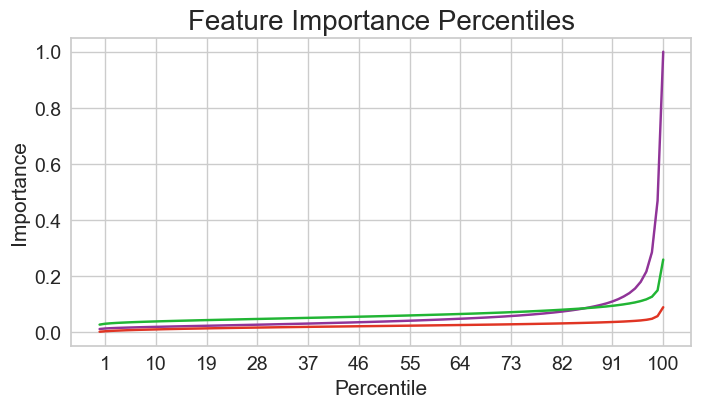

In [130]:
fig_dims = (8, 4)
fig, ax = plt.subplots(figsize=fig_dims)
sns.set_style("whitegrid")

# create the line plot with percentile tick labels
sns.lineplot(data=feature_importance_df, x="Percentile", y = "Importance", hue = "Feature Type", palette=["#903498", '#21b534', '#e03524'], ax=ax, legend = False)
plt.xticks(np.arange(1, 101, 9), np.arange(1, 101, 9))

ax.tick_params(axis='x', labelsize= 14) 
ax.tick_params(axis='y', labelsize= 14) 
plt.title('Feature Importance Percentiles', fontsize = 20)
ax.xaxis.label.set_size(15)
ax.yaxis.label.set_size(15)

plt.savefig("../../figures/feature_importance_percentiles.svg", format = "svg", dpi = 300, bbox_inches='tight')


In [103]:
percentile = feature_importance_grads['Importance'].quantile(0.99)
feature_importance_grads = feature_importance_grads[feature_importance_grads['Importance'] >= percentile]

In [104]:
percentile = feature_importance_conn['Importance'].quantile(0.99)
feature_importance_conn = feature_importance_conn[feature_importance_conn['Importance'] >= percentile]

In [105]:
percentile = feature_importance_disp['Importance'].quantile(0.99)
feature_importance_disp = feature_importance_disp[feature_importance_disp['Importance'] >= percentile]

In [106]:
feature_importance_df = pd.concat([feature_importance_grads, feature_importance_conn, feature_importance_disp])

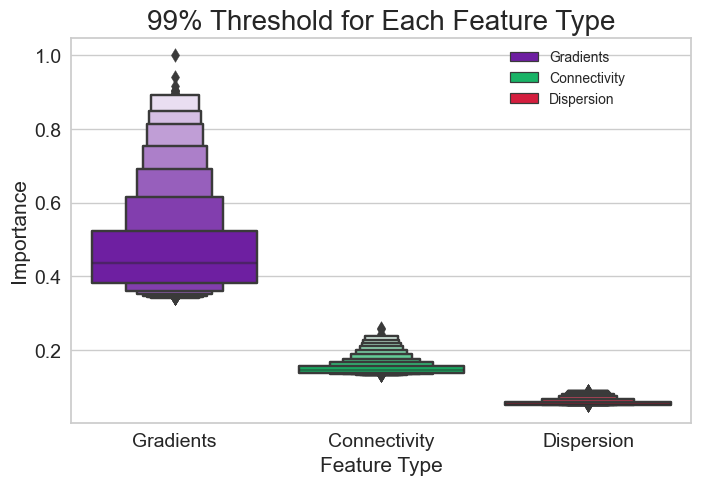

In [125]:
sns.set_style("whitegrid")
fig_dims = (8, 5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxenplot(data=feature_importance_df, x="Feature Type", y="Importance", hue="Feature Type", palette = ["#7209b7", "#00cc66", "#f2002b"], dodge = False, scale="area")

ax.tick_params(axis='x', labelsize= 14) 
ax.tick_params(axis='y', labelsize= 14) 
plt.title(label = "99% Threshold for Each Feature Type", fontsize = 20)
ax.xaxis.label.set_size(15)
ax.yaxis.label.set_size(15)
handles, labels = ax.get_legend_handles_labels()
lgd = ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.8,1))
plt.savefig("../../figures/feature_importance_top1.svg", format = "svg", dpi = 300, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [263]:
feature_labels = np.load("feature_labels.npy").tolist()
grad_labels = np.array([label.split("_")[-1] for label in feature_labels if "grad" in label]).astype(float)


In [264]:
grad_labels = (grad_labels/1000).astype(int) + 1

In [277]:
max_gradient_importance = feature_importance_grads["Importance"]

In [278]:
grad_importance = pd.DataFrame({"Gradient": grad_labels, "Importance": max_gradient_importance})

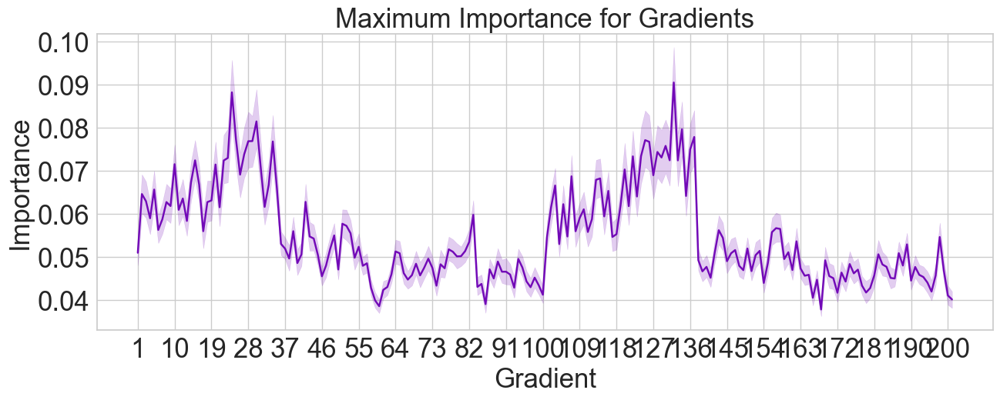

In [317]:
sns.set_style("whitegrid")
fig_dims = (15, 5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.lineplot(data=grad_importance, x="Gradient", y="Importance", color = "#7209b7")
plt.title(label = "Maximum Importance for Gradients", fontsize = 25)
ax.set_xticks(np.arange(1, 201, 9))
ax.set_xticklabels(np.append(np.arange(1, 201, 9)[:-1], 200))

ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=25)

ax.xaxis.label.set_size(25)
ax.yaxis.label.set_size(25)
handles, labels = ax.get_legend_handles_labels()
plt.savefig("../../figures/gradient_importance.svg", format = "svg", dpi = 300, bbox_inches='tight')


In [272]:
perf1Grad = pd.read_csv("results/perf1Grad.csv")
perfBest1000 = pd.read_csv("results/perfBest1000.csv")

In [265]:
dummy_acc = perf1Grad.loc[perf1Grad['Model'] == 'Dummy Classifier']['Accuracy'].values[0]
perf1Grad = perf1Grad[perf1Grad['Accuracy'] > dummy_acc]
dummy_acc = perfBest1000.loc[perfBest1000['Model'] == 'Dummy Classifier']['Accuracy'].values[0]
perfBest1000 = perfBest1000[perfBest1000['Accuracy'] > dummy_acc]

In [340]:
perf1Grad["Features"] = "Principal Gradient"
perfBest1000["Features"] = "Best 1000 Features"
perf_grad_vs_1000best = pd.concat([perf1Grad, perfBest1000])
perf_grad_vs_1000best = perf_grad_vs_1000best[perf_grad_vs_1000best["Model"] != "Dummy Classifier"]

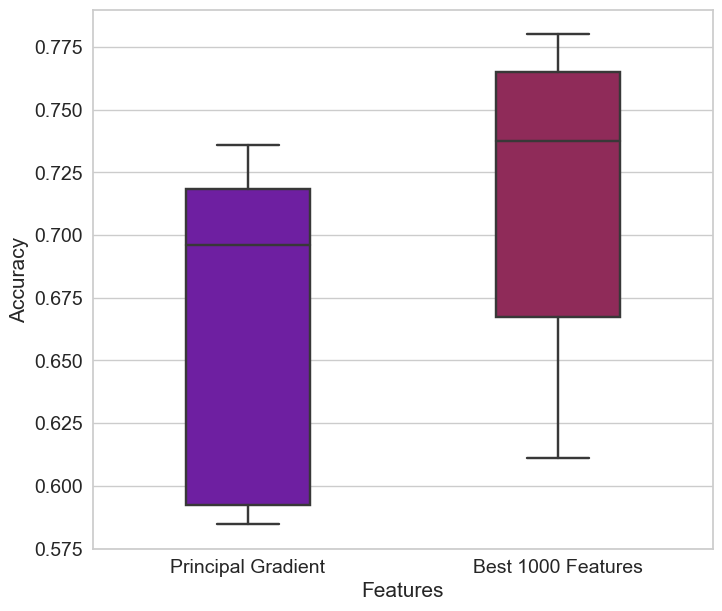

In [357]:
sns.set_style("whitegrid")
fig_dims = (8, 7)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=perf_grad_vs_1000best, x="Features", y="Accuracy", hue = "Features", dodge = False, palette = ["#7209b7", "#a01a58"], width=0.4)

ax.tick_params(axis='x', labelsize= 14) 
ax.tick_params(axis='y', labelsize= 14) 

ax.xaxis.label.set_size(15)
ax.yaxis.label.set_size(15)
# handles, labels = ax.get_legend_handles_labels()
# lgd = ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.2,1), fontsize = 15)
ax.get_legend().remove()
plt.savefig("../../figures/grad1_vs_1000best_acc.svg", format = "svg", dpi = 300, bbox_inches='tight')

#### Mann-Whitney U Test for Grad1 vs 1000 Best Features: ACCURACY

In [311]:
from scipy.stats import mannwhitneyu
acc_1grad = perf_grad_vs_1000best[perf_grad_vs_1000best["Features"] == "Principal Gradient"]["Accuracy"]
acc_1000best = perf_grad_vs_1000best[perf_grad_vs_1000best["Features"] == "Best 1000 Features"]["Accuracy"]
statistic, p_value = mannwhitneyu(acc_1grad, acc_1000best, alternative='two-sided')
print(statistic, p_value)

31.0 0.056873036034794405


In [352]:
auc_1grad = perf_grad_vs_1000best[perf_grad_vs_1000best["Features"] == "Principal Gradient"]["AUC"]
auc_1000best = perf_grad_vs_1000best[perf_grad_vs_1000best["Features"] == "Best 1000 Features"]["AUC"]
statistic, p_value = mannwhitneyu(auc_1grad, auc_1000best, alternative='two-sided')
print(statistic, p_value)

17.0 0.0047488281461544185


In [350]:
perf_grad_vs_1000best = perf_grad_vs_1000best[perf_grad_vs_1000best["AUC"] > 0]

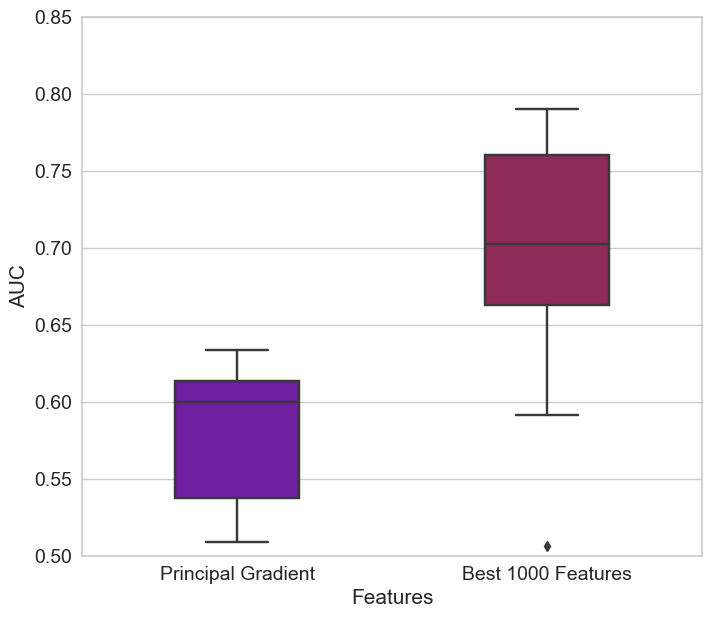

In [360]:
sns.set_style("whitegrid")
fig_dims = (8, 7)
fig, ax = plt.subplots(figsize=fig_dims)
sns.boxplot(data=perf_grad_vs_1000best, x="Features", y="AUC", hue = "Features", dodge = False, palette = ["#7209b7", "#a01a58"], width = 0.4)
ax.tick_params(axis='x', labelsize= 14) 
ax.tick_params(axis='y', labelsize= 14) 

ax.xaxis.label.set_size(15)
ax.yaxis.label.set_size(15)
ax.get_legend().remove()
ax.set(ylim=(0.50, 0.85))
plt.savefig("../../figures/grad1_vs_1000best_auc.svg", format = "svg", dpi = 300, bbox_inches='tight')

## Model Performance

In [533]:
results_dir = "results"

In [534]:
results = pd.read_csv(f"{results_dir}/model_results.csv")
dummy_acc = results.loc[results['Model'] == 'Dummy Classifier'].set_index('N features')['Accuracy']
#dummy_filtered_results = results.groupby('N features').apply(lambda x: x.loc[x['Accuracy'] > dummy_acc[x.name]])
dummy_filtered_results = results[results['Model'] !=  'Dummy Classifier']
dummy_filtered_results = dummy_filtered_results.reset_index(drop=True)
best_models = results.groupby('N features').apply(lambda x: x.loc[x['Accuracy'].idxmax()])
best_models = best_models.reset_index(drop=True)

In [535]:
from scipy.stats import percentileofscore

for n_features in best_models["N features"].unique():
    n_features = int(n_features)
    try:
        null_dist_acc = np.load(f"results/null_dist/null_dist_{n_features}.npy")[:, 0]
        null_dist_auc = np.load(f"results/null_dist/null_dist_{n_features}.npy")[:, 1]

        best_acc = best_models[best_models["N features"] == float(n_features)]["Accuracy"].values[0]
        best_auc = best_models[best_models["N features"] == float(n_features)]["AUC"].values[0]

        pval_acc = 1-percentileofscore(null_dist_acc, best_acc) / 100
        pval_auc = 1-percentileofscore(null_dist_auc, best_auc) / 100

        best_models.loc[best_models["N features"] == float(n_features), "Pval Acc"] =  pval_acc
        best_models.loc[best_models["N features"] == float(n_features), "Pval AUC"] =  pval_auc
    except:
        pass

In [536]:
results_pca_data = pd.read_csv(f"{results_dir}/pca_model_results.csv")
best_model_pca = results_pca_data[results_pca_data["Accuracy"] == results_pca_data["Accuracy"].max()]
n_models = len(best_model_pca)
n_levels = len(results["N features"].unique())
best_model_pca = pd.concat([best_model_pca]*n_levels, ignore_index=True)
best_model_pca["N features"] = list(results["N features"].unique()) * n_models


In [537]:
confound_results = pd.read_csv(f"{results_dir}/confound_model_results.csv")
counfound_dummy_filtered_results = confound_results[confound_results["Accuracy"] == confound_results["Accuracy"].max()]
n_models = len(counfound_dummy_filtered_results)
n_levels = len(results["N features"].unique())
counfound_dummy_filtered_results = pd.concat([counfound_dummy_filtered_results]*n_levels, ignore_index=True)
counfound_dummy_filtered_results["N features"] = list(results["N features"].unique()) * n_models



In [538]:
dummy_results = results.loc[results['Model'] == 'Dummy Classifier']

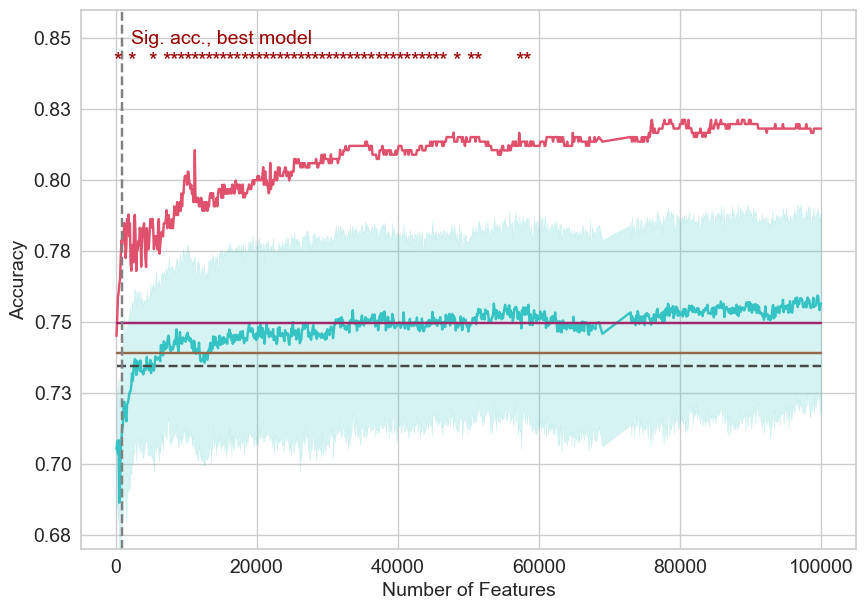

In [539]:
from matplotlib.ticker import FormatStrFormatter

sns.set_style("whitegrid")
fig_dims = (10, 7)
fig, ax = plt.subplots(figsize=fig_dims)

sns.lineplot(
    data=dummy_filtered_results,
    x="N features", y="Accuracy", color="#35c4c3"
)
sns.lineplot(
    data=best_models, estimator = None,
    x="N features", y="Accuracy", color="#e0516d"
)
sns.lineplot(
    data=dummy_results, estimator = None,
    x="N features", y="Accuracy", color="#464846", linestyle = "--"
)
sns.lineplot(
    data=counfound_dummy_filtered_results,x = "N features", y="Accuracy", color="#95684b"
)
sns.lineplot(
    data=best_model_pca,x = "N features", y="Accuracy", color="#a1286a"
)

n_features = best_models["N features"].values
pval_acc = best_models["Pval Acc"].values

ax.set(ylim=(0.67, 0.86))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

for i in range(1, len(n_features), 10):
    if pval_acc[i] < 0.05:
        ax.annotate("*", xy=(n_features[i], 0.84), fontsize=16, ha="center", color = "#980000", label = "Best model: significance")
ax.annotate("Sig. acc., best model", xy=(15000, 0.848), fontsize=14, ha="center", color = "#980000")

plt.axvline(x=936, color='gray', linestyle='--')
ax.set_xlabel("Number of Features", fontsize=14)
ax.set_ylabel("Accuracy", fontsize=14)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)
plt.savefig("../../figures/Accuracy.svg", format = "svg", dpi = 300, bbox_inches='tight')

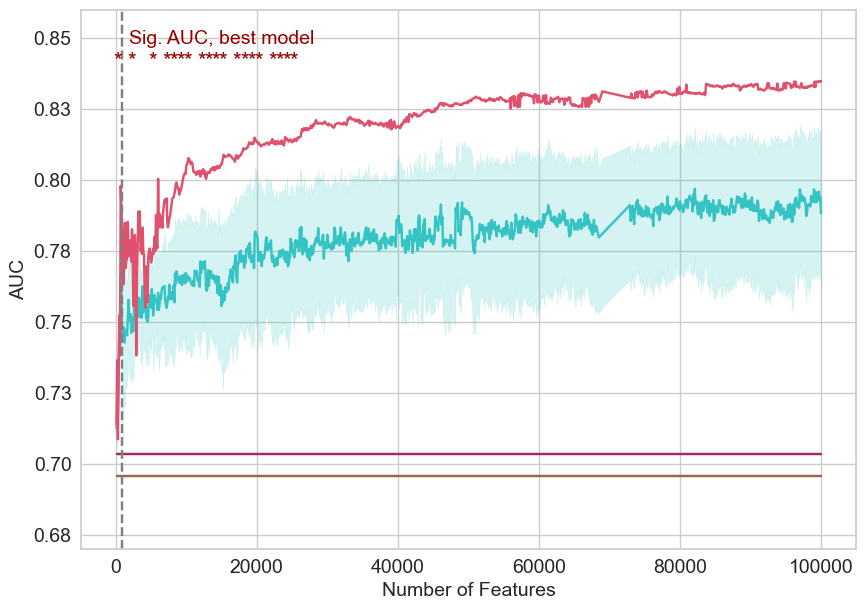

In [99]:

sns.set_style("whitegrid")
fig_dims = (10, 7)
fig, ax = plt.subplots(figsize=fig_dims)

sns.lineplot(
    data=dummy_filtered_results[dummy_filtered_results["AUC"]>0],
    x="N features", y="AUC", color="#35c4c3",
)
sns.lineplot(
    data=best_models[best_models["AUC"]>0], estimator = None,
    x="N features", y="AUC", color="#e0516d"
)
# sns.lineplot(
#     data=dummy_results, estimator = None,
#     x="N features", y="AUC", color="#464846", linestyle = "--", label = "Dummy classifier"
# )
sns.lineplot(
    data=counfound_dummy_filtered_results,x = "N features", y="AUC", color="#95684b"
)
sns.lineplot(
    data=best_model_pca,x = "N features", y="AUC", color="#a1286a"
)
ax.set(ylim=(0.67, 0.86))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

pval_auc = best_models["Pval AUC"].values

for i in range(1, len(n_features), 10):
    if pval_auc[i] < 0.05:
        ax.annotate("*", xy=(n_features[i], 0.84), fontsize=16, ha="center", color = "#980000", label = "Best model: significance")
ax.annotate("Sig. AUC, best model", xy=(15000, 0.848), fontsize=14, ha="center", color = "#980000")

plt.axvline(x=936, color='gray', linestyle='--')
ax.set_xlabel("Number of Features", fontsize=14)
ax.set_ylabel("AUC", fontsize=14)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)

plt.savefig("../../figures/AUC.svg", format = "svg", dpi = 300, bbox_inches='tight')

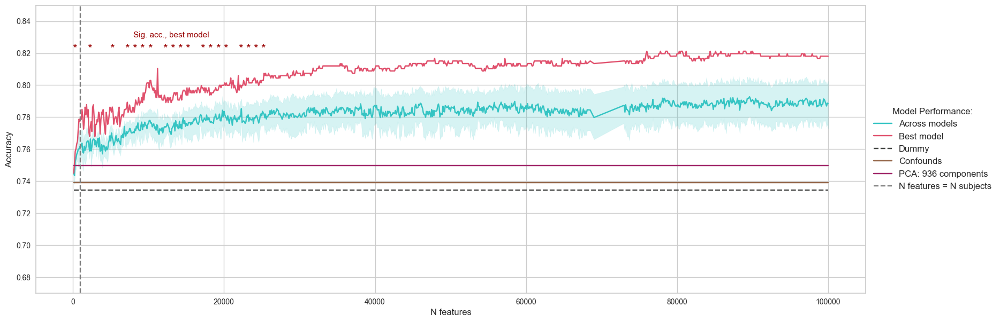

In [106]:
fig_dims = (20, 7)
fig, ax = plt.subplots(figsize=fig_dims)

sns.lineplot(
    data=dummy_filtered_results,
    x="N features", y="Accuracy", color="#35c4c3", label = "Across models"
)
sns.lineplot(
    data=best_models, estimator = None,
    x="N features", y="Accuracy", color="#e0516d", label = "Best model"
)
sns.lineplot(
    data=dummy_results, estimator = None,
    x="N features", y="Accuracy", color="#464846", linestyle = "--", label = "Dummy"
)
sns.lineplot(
    data=counfound_dummy_filtered_results,x = "N features", y="Accuracy", color="#95684b", label = "Confounds"
)
sns.lineplot(
    data=best_model_pca,x = "N features", y="Accuracy", color="#a1286a", label = "PCA: 936 components"
)
plt.axvline(x=936, color='gray', linestyle='--', label = "N features = N subjects")
ax.set(ylim=(0.67, 0.85))
for i in range(1, len(n_features), 10):
    if pval_auc[i] < 0.05:
        ax.annotate("*", xy=(n_features[i], 0.821), fontsize=16, ha="center", color = "#980000", label = "Best model: significance")
ax.annotate("Sig. acc., best model", xy=(13000, 0.83), fontsize=11, ha="center", color = "#980000")

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=12, title = "Model Performance:")
# ax.set_xlabel("Number of Features", fontsize=14)
# ax.set_ylabel("AUC", fontsize=14)
# ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
# ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)

plt.savefig("../../figures/legend.svg", format = "svg", dpi = 300, bbox_inches='tight')

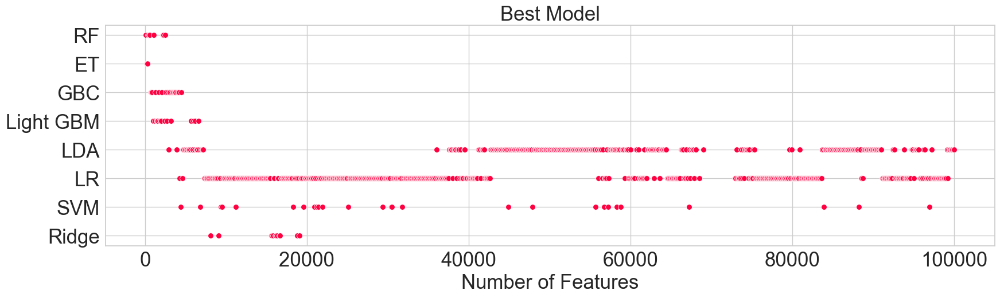

In [322]:
sns.set_style("whitegrid")
fig_dims = (20, 5)
fig, ax = plt.subplots(figsize=fig_dims)
best_models_rank = best_models.copy()
best_models_rank["Model"] = best_models_rank["Model"].astype(str)

sns.scatterplot(
    data=best_models_rank,
    x="N features", y="Model", color="#ff0040",
)
y_labels = ["RF", "ET", "GBC", "Light GBM", "LDA", "LR", "SVM", "Ridge"]
ax.set_xlabel("Number of Features", fontsize=25)
ax.set_ylabel("")
ax.set_yticklabels(y_labels)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=25)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=25)
plt.title("Best Model", fontsize=25)
plt.savefig("../../figures/model_rank.svg", format = "svg", dpi = 300, bbox_inches='tight')

## Feature Interpretation: Neurosynth & Cortical Surface

In [516]:
feature_importance = np.load("feature_importance_matrix.npy")
feature_importance = np.max(feature_importance, axis = 1)
#feature_importance = (feature_importance - np.mean(feature_importance)) / np.std(feature_importance)
feature_importance = (feature_importance - np.min(feature_importance)) / (np.max(feature_importance) - np.min(feature_importance))


In [517]:
feature_labels = np.load("feature_labels.npy").tolist()
best_100_features = pd.read_csv("best_features/100_best_features.csv")
best_100_indices = [feature_labels.index(col) for col in best_100_features.columns]

In [518]:
feature_importance_df = pd.DataFrame({"Feature": best_100_features.columns.tolist(), "Importance": feature_importance[best_100_indices]})

In [519]:
region_indices = []
for column in best_100_features.columns:
    value_index = int(column.split("_")[-1])
    i_region = int(str(value_index)[-3:])
    region_indices.append(i_region)

In [520]:
feature_importance_df["region"] = region_indices

In [521]:
transformed_df = feature_importance_df.groupby("region")["Importance"].sum().reset_index()
region_importance = np.zeros(1000)
region_importance[transformed_df["region"].values] = transformed_df["Importance"].values

In [522]:
transformed_df

,region,Importance
0,0,3.279304
1,1,0.741235
2,2,2.212747
3,4,2.281435
4,5,5.809320
5,200,3.895956
6,201,0.745722
7,202,2.381920
8,204,1.516862
9,205,3.905924


In [523]:
schaefer_labels_1000 = load_parcellation('schaefer', scale=1000, join=True)
region_importance = map_to_labels(region_importance, schaefer_labels_1000, mask=schaefer_labels_1000 != 0, fill=np.nan)

In [524]:
lh, rh = surfaces['veryinflated']

In [525]:
region_importance[np.where(region_importance == 0)] = np.nan

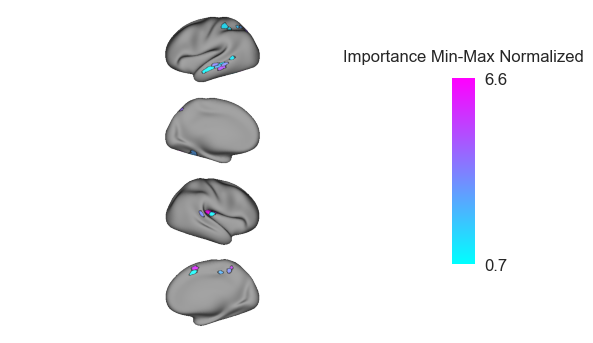

In [531]:
imp_regions = Plot(lh, rh, brightness = 3, layout = "column")
kws = {'location': 'right', 'label_direction': 0, 'decimals': 1,
       'fontsize': 12, 'n_ticks': 2, 'shrink': 1.5, 'aspect': 8,
       'draw_border': False}
imp_regions.add_layer({'left': region_importance[:32492], 'right': region_importance[32492:]}, cmap = "cool", zero_transparent=False, cbar_label='Importance Min-Max Normalized')
imp_regions.add_layer({'left': region_importance[:32492], 'right': region_importance[32492:]}, cmap='gray',
            as_outline=True, cbar=False)
fig = imp_regions.build(cbar_kws=kws)
fig.savefig(f"../../figures/cortex_regions/100_features_importance_regions.svg", format = "svg", dpi = 300, bbox_inches='tight')

In [30]:
from matplotlib.colors import ListedColormap

colors = ['green']
cmap = ListedColormap(colors, 'regions', N=1)

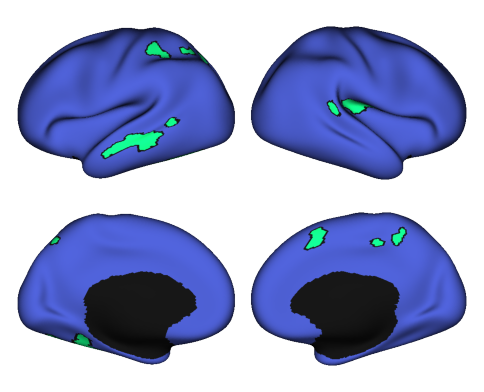

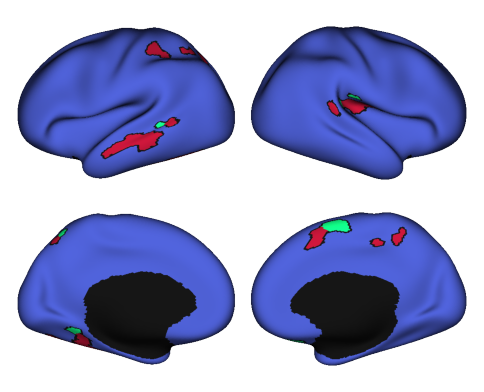

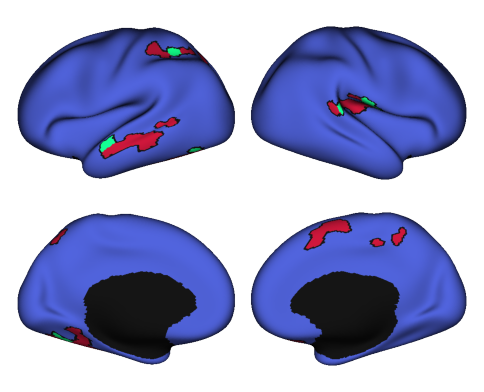

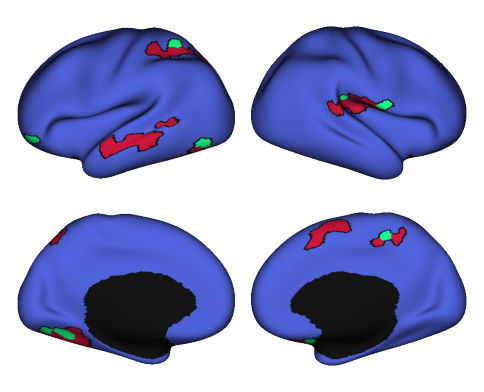

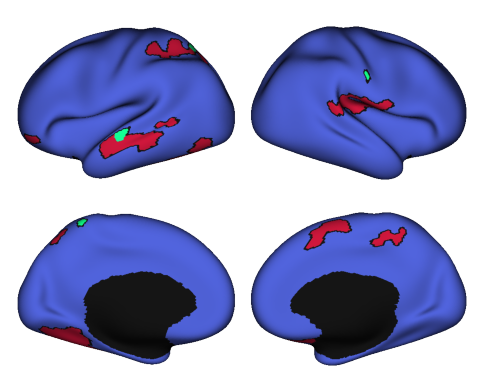

...

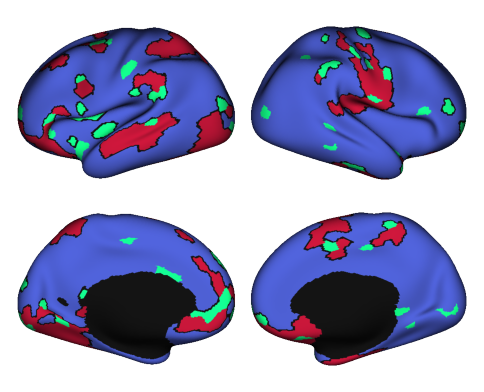

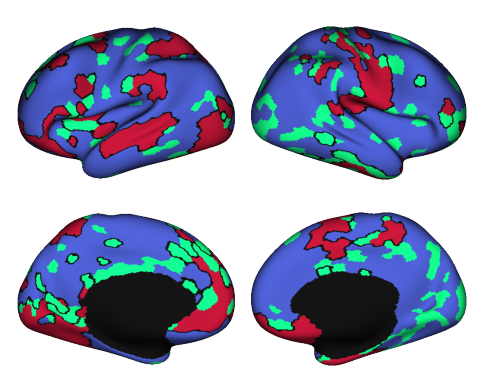

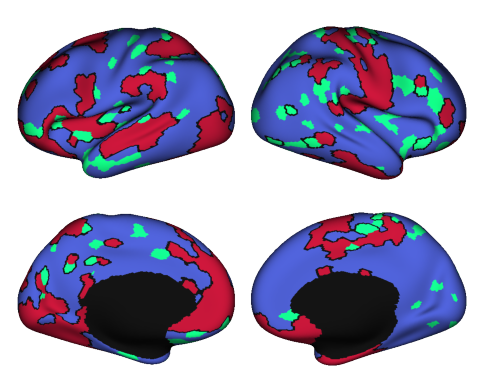

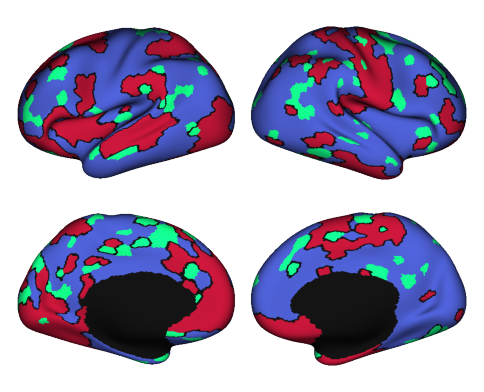

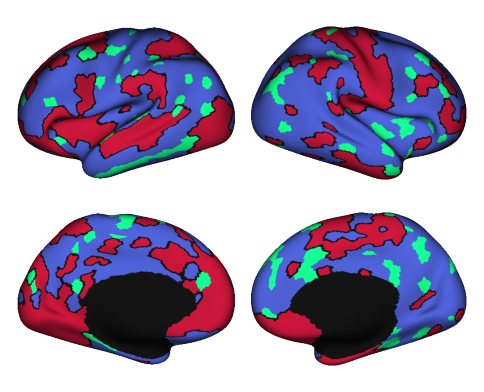

In [178]:
import matplotlib.pyplot as plt

# import matplotlib.animation as animation
lh, rh = surfaces['veryinflated']
n_features = np.loadtxt("../neurosynth/n_features.txt", dtype=str).tolist()
sulc_lh, sulc_rh = surfaces['sulc']


for i, n in enumerate(n_features):
    best_features = pd.read_csv(f"best_features/{n}_best_features.csv")
    best_features = best_features.filter(like='grad')

    regions_surf = get_feature_regions(best_features, True)
    imp_regions = Plot(lh, rh)
    imp_regions.add_layer({'left': regions_surf[:32492], 'right': regions_surf[32492:]}, cmap = "coolwarm", zero_transparent=False, cbar = False)

    if n != "100":
        prev_csv = f"{n_features[i - 1]}_best_features.csv"
        new_regions = get_additional_regions(pd.read_csv(f"best_features/{n}_best_features.csv"), pd.read_csv(f"best_features/{prev_csv}"), True)
        new_regions[new_regions == 0] = np.nan
        imp_regions.add_layer({'left': new_regions[:32492], 'right': new_regions[32492:]}, cmap = "winter", cbar=False, zero_transparent=False, as_outline = False)
    else:
        regions_surf[regions_surf == 0] = np.nan
        imp_regions.add_layer({'left': regions_surf[:32492], 'right': regions_surf[32492:]}, cmap = "winter", cbar=False, zero_transparent=False, as_outline = False)
    imp_regions.add_layer({'left': regions_surf[:32492], 'right': regions_surf[32492:]}, cmap='gray',
                as_outline=True, cbar=False)
    fig = imp_regions.build()
    fig.savefig(f"../../figures/cortex_regions/{n}_features_to_regions_cortex.svg", format = "svg", dpi = 300, bbox_inches='tight')
    

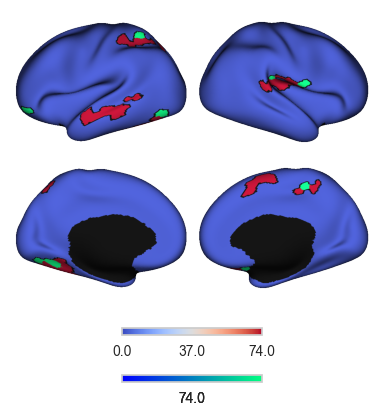

In [94]:

best_features = pd.read_csv(f"best_features/{n_features[3]}_best_features.csv")
regions_surf = get_feature_regions(best_features, True)
imp_regions = Plot(lh, rh)
imp_regions.add_layer({'left': regions_surf[:32492], 'right': regions_surf[32492:]}, cmap = "coolwarm", zero_transparent=False)
imp_regions.add_layer({'left': regions_surf[:32492], 'right': regions_surf[32492:]}, cmap='gray',
            as_outline=True, cbar=False)
prev_csv = f"{n_features[2]}_best_features.csv"
new_regions = get_additional_regions(pd.read_csv(f"best_features/{n_features[3]}_best_features.csv"), pd.read_csv(f"best_features/{prev_csv}"), True)
new_regions[new_regions == 0] = np.nan

imp_regions.add_layer({'left': new_regions[:32492], 'right': new_regions[32492:]}, cmap = "winter", cbar=True, zero_transparent=False, as_outline = False)
fig = imp_regions.build()